In [1]:
%matplotlib inline
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
print("tensorflow version: {}".format(tf.__version__))

from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization, Conv2D, Conv2DTranspose
from tensorflow.keras.layers import Activation, LeakyReLU, Reshape, Flatten
    
from tensorflow.keras.initializers import RandomNormal, RandomUniform
    
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD, Adam

tensorflow version: 2.3.0


In [2]:
import h5py

# dataset filename
filename = "food_c101_n10099_r64x64x3.h5"

food_dataset = h5py.File(filename, 'r')

print(food_dataset.keys())

category = np.array(food_dataset['category'])
category_names = np.array(food_dataset['category_names'])
data = np.array(food_dataset['images'])

# check shape
data.shape

<KeysViewHDF5 ['category', 'category_names', 'images']>


(10099, 64, 64, 3)

In [3]:
m = data.shape[0]
h = data.shape[1]
w = data.shape[2]

data_flatten = np.copy(data).reshape(m, -1)

print("data flatten: {}".format(data_flatten.shape))

# normalize pixel values from [0, 255] to [-1, 1]
data_flatten = (data_flatten / 127.5) - 1

print("pixal min value = {}".format(data_flatten.min()))
print("pixal max value = {}".format(data_flatten.max()))

data flatten: (10099, 12288)
pixal min value = -1.0
pixal max value = 1.0


[b'baby_back_ribs']


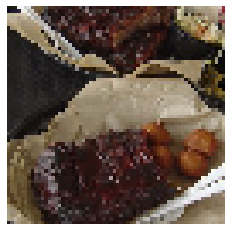

In [4]:
idx = 5454

print(category_names[category[idx]])

plt.figure()
plt.imshow(data[idx,:,:,:])
plt.axis('off')
plt.show()

In [5]:
## generator building function
def build_generator(hidden_dim, fc123, alpha, momentum):
    # input layers
    inputs = Input(shape = (hidden_dim, ), name = 'G_input')
    # 1st FC
    x = Dense(fc123[0], activation = LeakyReLU(alpha = alpha), name = 'G_FC1')(inputs)
    x = BatchNormalization(momentum = momentum, name = 'G_BN1')(x)
    # 2nd FC
    x = Dense(fc123[1], activation = LeakyReLU(alpha = alpha), name = 'G_FC2')(x)
    x = BatchNormalization(momentum = momentum, name = 'G_BN2')(x)
    # 3rd FC
    x = Dense(fc123[2], activation = LeakyReLU(alpha = alpha), name = 'G_FC3')(x)
    x = BatchNormalization(momentum = momentum, name = 'G_BN3')(x)
    # output layer
    outputs = Dense(h*w*3, activation = 'tanh', name = 'G_output_FC')(x)
    # geerator model
    model = Model(inputs = inputs, outputs = outputs, name = 'generator')

    return model

In [6]:
def build_discriminator(fc123, alpha, dropout_rate):
    # input layer
    inputs = Input(shape = (w*h*3, ), name = 'D_input')
    # 1st FC
    x = Dense(fc123[0], activation = LeakyReLU(alpha = alpha), name = 'D_FC1')(inputs)
    if dropout_rate:
        x = Dropout(dropout_rate)(x)
    #x = BatchNormalization(name = 'D_BN1')(x)
    # 2nd FC
    x = Dense(fc123[1], activation = LeakyReLU(alpha = alpha), name = 'D_FC2')(x)
    if dropout_rate:
        x = Dropout(dropout_rate)(x)
    #x = BatchNormalization(name = 'D_BN2')(x)
    # 3rd FC
    x = Dense(fc123[2], activation = LeakyReLU(alpha = alpha), name = 'D_FC3')(x)
    if dropout_rate:
        x = Dropout(dropout_rate)(x)
    #x = BatchNormalization(name = 'D_BN3')(x)
    # output layer (binary)
    outputs = Dense(1, activation = 'sigmoid', name = 'D_output_FC')(x)
    # discriminator model
    model = Model(inputs = inputs, outputs = outputs, name = 'discriminator')
    
    return model

Model: "generator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
G_input (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
G_FC1 (Dense)                (None, 512)               51712     
_________________________________________________________________
G_BN1 (BatchNormalization)   (None, 512)               2048      
_________________________________________________________________
G_FC2 (Dense)                (None, 1024)              525312    
_________________________________________________________________
G_BN2 (BatchNormalization)   (None, 1024)              4096      
_________________________________________________________________
G_FC3 (Dense)                (None, 2048)              2099200   
_________________________________________________________________
G_BN3 (BatchNormalization)   (None, 2048)              81

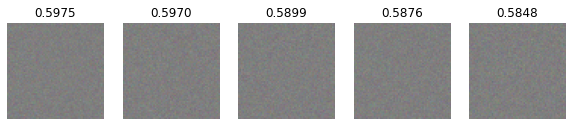

Epoch 1000 	 g_loss: 2.6585, d_loss:0.5110, d_acc: 0.7461


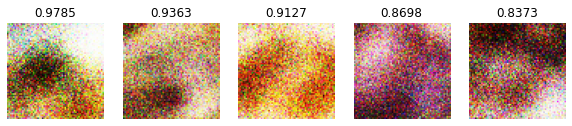

Epoch 2000 	 g_loss: 3.8096, d_loss:0.2221, d_acc: 0.9180


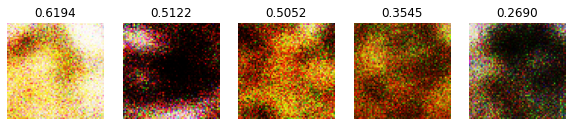

Epoch 3000 	 g_loss: 3.8882, d_loss:0.2574, d_acc: 0.9023


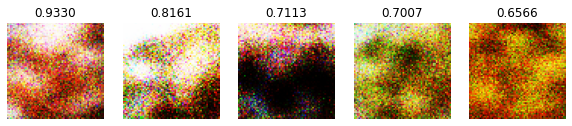

Epoch 4000 	 g_loss: 5.6088, d_loss:0.2141, d_acc: 0.9180


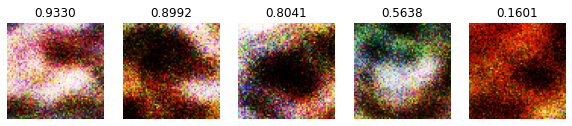

Epoch 5000 	 g_loss: 2.6651, d_loss:0.3553, d_acc: 0.8477


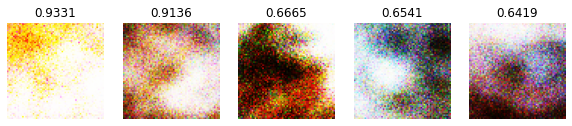

Epoch 6000 	 g_loss: 4.3018, d_loss:0.1598, d_acc: 0.9414


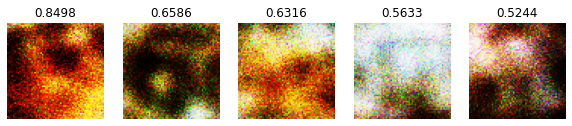

Epoch 7000 	 g_loss: 2.9645, d_loss:0.2957, d_acc: 0.8789


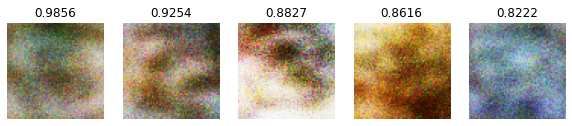

Epoch 8000 	 g_loss: 3.0246, d_loss:0.2117, d_acc: 0.9219


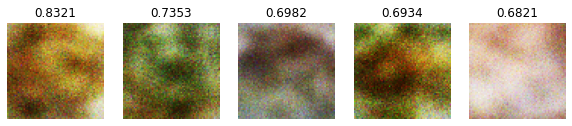

Epoch 9000 	 g_loss: 3.7663, d_loss:0.1721, d_acc: 0.9297


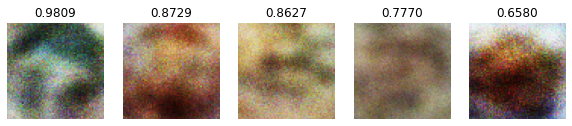

Epoch 10000 	 g_loss: 6.1334, d_loss:0.1708, d_acc: 0.9453


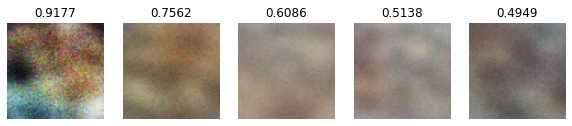

Epoch 11000 	 g_loss: 2.7170, d_loss:0.2739, d_acc: 0.8945


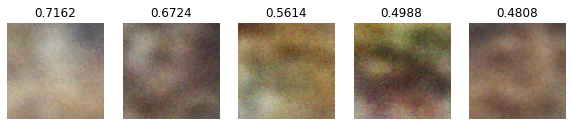

Epoch 12000 	 g_loss: 5.2898, d_loss:0.2139, d_acc: 0.9141


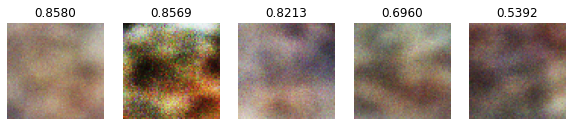

Epoch 13000 	 g_loss: 8.4046, d_loss:0.0970, d_acc: 0.9688


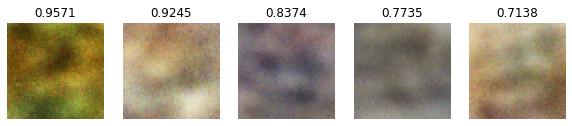

Epoch 14000 	 g_loss: 3.7441, d_loss:0.1096, d_acc: 0.9727


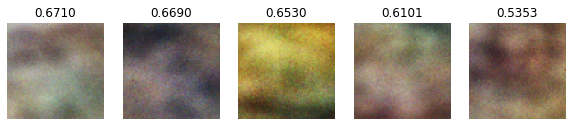

Epoch 15000 	 g_loss: 4.2923, d_loss:0.1252, d_acc: 0.9609


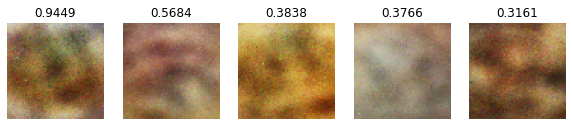

Epoch 16000 	 g_loss: 4.9652, d_loss:0.0802, d_acc: 0.9766


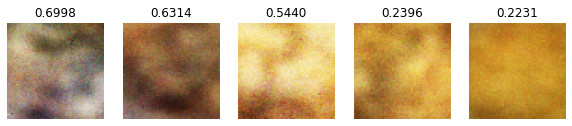

Epoch 17000 	 g_loss: 4.6178, d_loss:0.0731, d_acc: 0.9766


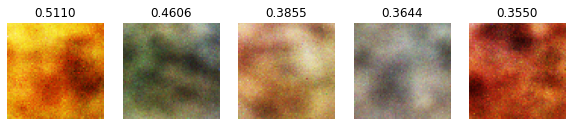

Epoch 18000 	 g_loss: 5.3012, d_loss:0.0971, d_acc: 0.9727


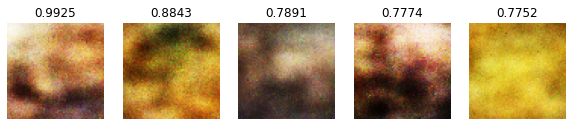

Epoch 19000 	 g_loss: 6.5344, d_loss:0.0571, d_acc: 0.9805


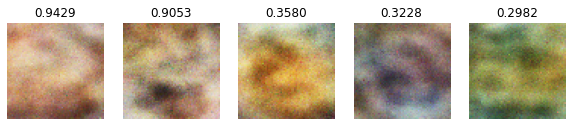

Epoch 20000 	 g_loss: 4.7249, d_loss:0.2609, d_acc: 0.8984


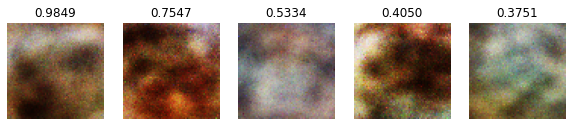

Epoch 21000 	 g_loss: 5.2708, d_loss:0.0783, d_acc: 0.9727


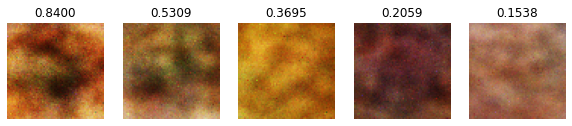

Epoch 22000 	 g_loss: 5.9781, d_loss:0.0550, d_acc: 0.9883


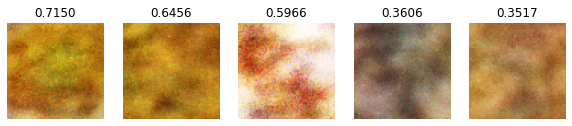

Epoch 23000 	 g_loss: 5.7958, d_loss:0.0731, d_acc: 0.9727


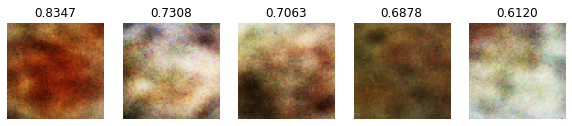

Epoch 24000 	 g_loss: 6.1033, d_loss:0.0686, d_acc: 0.9883


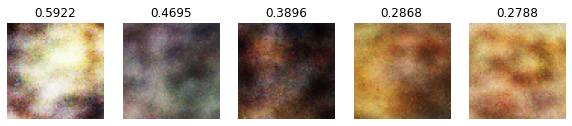

Epoch 25000 	 g_loss: 4.7040, d_loss:0.0603, d_acc: 0.9766


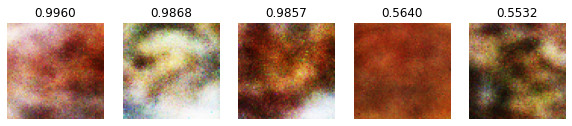

Epoch 26000 	 g_loss: 5.4902, d_loss:0.1037, d_acc: 0.9648


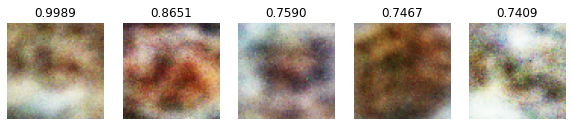

Epoch 27000 	 g_loss: 8.8206, d_loss:0.0897, d_acc: 0.9766


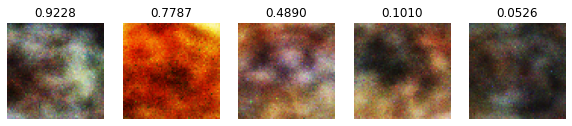

Epoch 28000 	 g_loss: 4.8670, d_loss:0.1153, d_acc: 0.9648


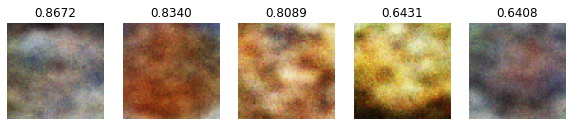

Epoch 29000 	 g_loss: 5.8055, d_loss:0.0268, d_acc: 0.9961


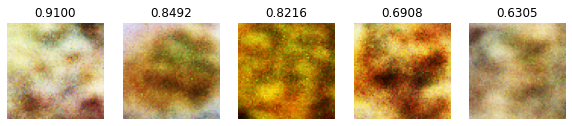

Epoch 30000 	 g_loss: 7.4306, d_loss:0.0497, d_acc: 0.9805


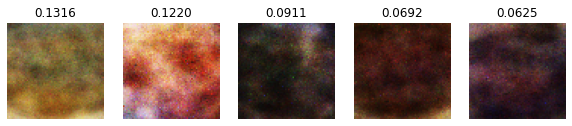

Epoch 31000 	 g_loss: 7.2241, d_loss:0.0702, d_acc: 0.9766


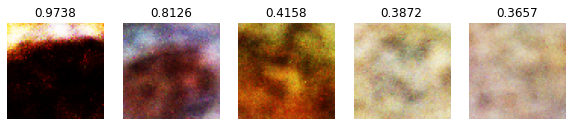

Epoch 32000 	 g_loss: 4.3488, d_loss:0.0612, d_acc: 0.9844


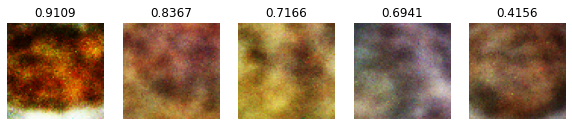

Epoch 33000 	 g_loss: 5.7785, d_loss:0.0273, d_acc: 0.9922


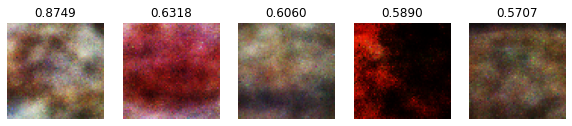

Epoch 34000 	 g_loss: 5.3735, d_loss:0.0405, d_acc: 0.9922


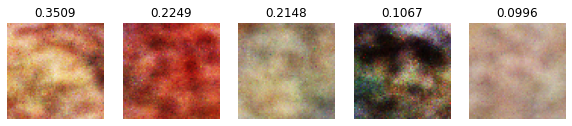

Epoch 35000 	 g_loss: 6.7614, d_loss:0.0649, d_acc: 0.9727


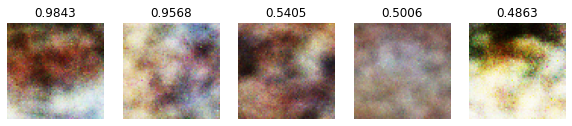

Epoch 36000 	 g_loss: 4.1063, d_loss:0.2852, d_acc: 0.9219


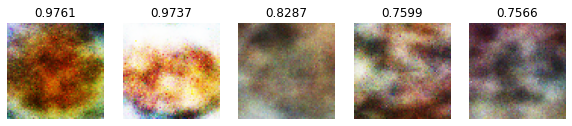

Epoch 37000 	 g_loss: 11.3225, d_loss:0.3341, d_acc: 0.8945


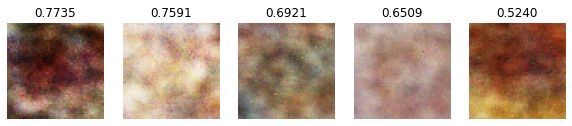

Epoch 38000 	 g_loss: 6.4604, d_loss:0.1045, d_acc: 0.9609


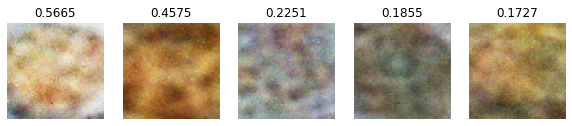

Epoch 39000 	 g_loss: 8.4320, d_loss:0.0387, d_acc: 0.9844


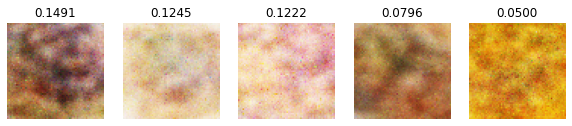

Epoch 40000 	 g_loss: 7.7580, d_loss:0.0132, d_acc: 0.9961


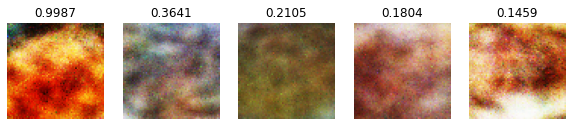

Epoch 41000 	 g_loss: 5.5114, d_loss:0.0436, d_acc: 0.9883


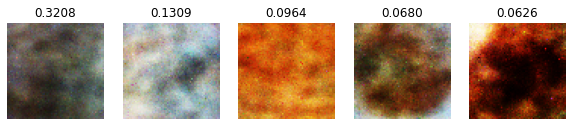

Epoch 42000 	 g_loss: 6.2856, d_loss:0.0980, d_acc: 0.9688


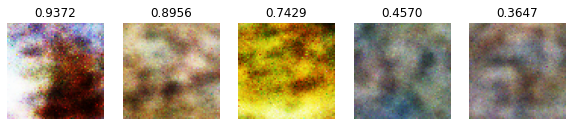

Epoch 43000 	 g_loss: 5.2249, d_loss:0.0506, d_acc: 0.9883


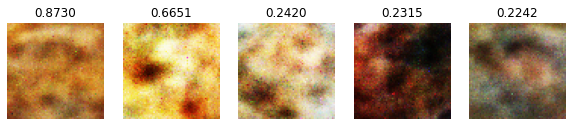

Epoch 44000 	 g_loss: 7.5304, d_loss:0.0096, d_acc: 1.0000


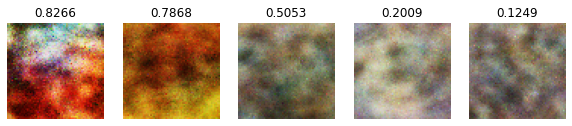

Epoch 45000 	 g_loss: 5.2250, d_loss:0.0230, d_acc: 0.9961


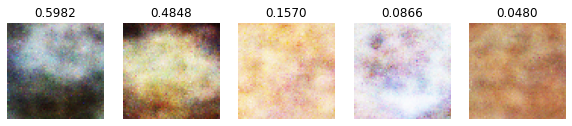

Epoch 46000 	 g_loss: 7.6382, d_loss:0.0260, d_acc: 0.9844


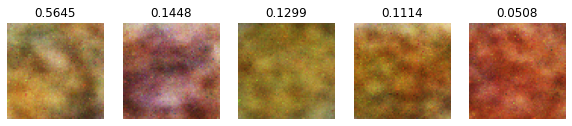

Epoch 47000 	 g_loss: 6.6880, d_loss:0.0790, d_acc: 0.9766


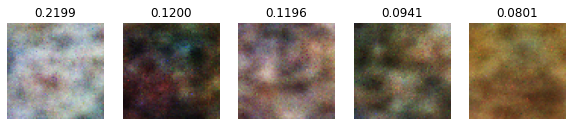

Epoch 48000 	 g_loss: 8.2709, d_loss:0.0374, d_acc: 0.9844


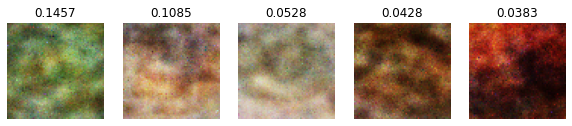

Epoch 49000 	 g_loss: 5.5816, d_loss:0.0556, d_acc: 0.9805


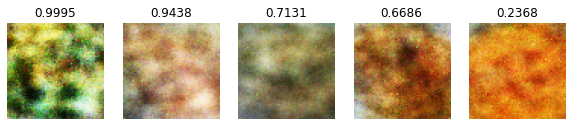

Epoch 50000 	 g_loss: 5.0573, d_loss:0.0775, d_acc: 0.9883


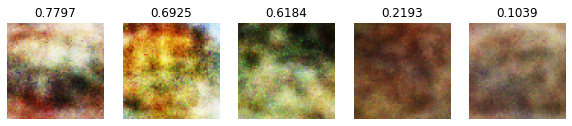

Epoch 51000 	 g_loss: 6.3782, d_loss:0.0921, d_acc: 0.9648


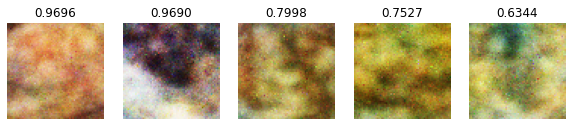

Epoch 52000 	 g_loss: 7.8978, d_loss:0.0238, d_acc: 0.9961


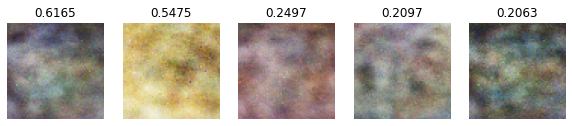

Epoch 53000 	 g_loss: 13.3953, d_loss:0.4198, d_acc: 0.8867


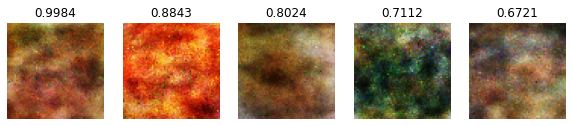

Epoch 54000 	 g_loss: 4.7867, d_loss:0.1656, d_acc: 0.9531


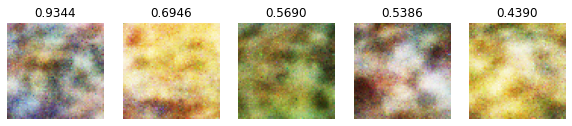

Epoch 55000 	 g_loss: 6.6300, d_loss:0.0124, d_acc: 0.9961


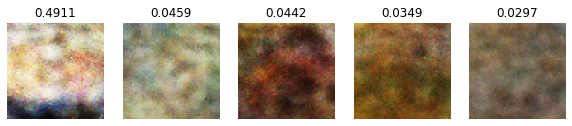

Epoch 56000 	 g_loss: 6.2715, d_loss:0.0295, d_acc: 0.9961


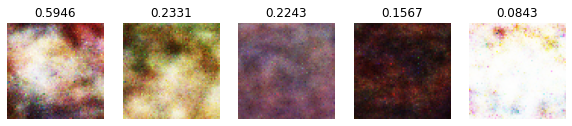

Epoch 57000 	 g_loss: 6.2484, d_loss:0.0196, d_acc: 0.9961


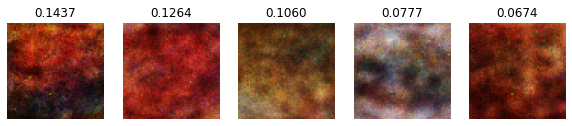

Epoch 58000 	 g_loss: 6.8720, d_loss:0.0286, d_acc: 0.9922


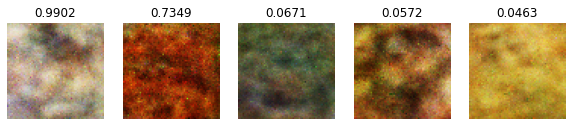

Epoch 59000 	 g_loss: 7.1852, d_loss:0.1098, d_acc: 0.9883


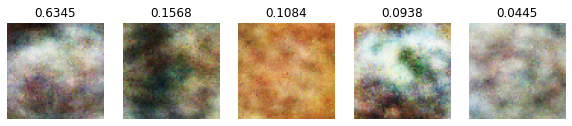

Epoch 60000 	 g_loss: 7.6460, d_loss:0.0291, d_acc: 0.9883


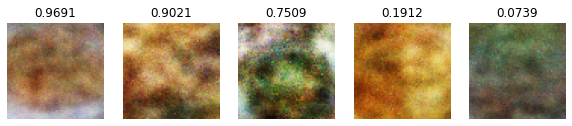

Epoch 61000 	 g_loss: 6.5301, d_loss:0.0244, d_acc: 0.9883


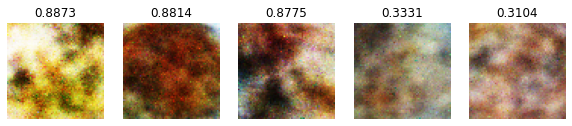

Epoch 62000 	 g_loss: 6.7644, d_loss:0.0129, d_acc: 1.0000


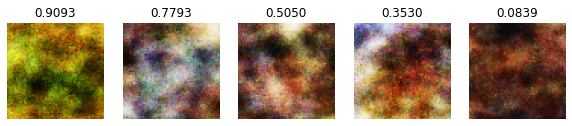

Epoch 63000 	 g_loss: 5.0389, d_loss:0.0842, d_acc: 0.9766


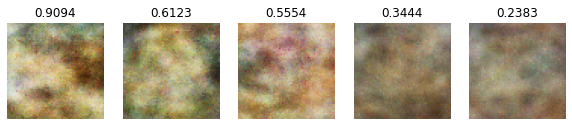

Epoch 64000 	 g_loss: 7.9309, d_loss:0.0069, d_acc: 1.0000


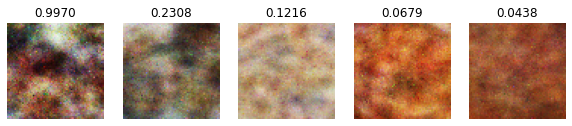

Epoch 65000 	 g_loss: 5.3732, d_loss:0.0254, d_acc: 0.9922


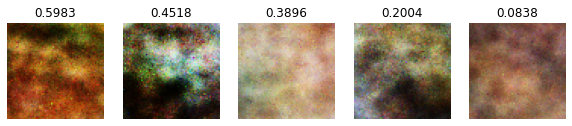

Epoch 66000 	 g_loss: 6.3089, d_loss:0.0386, d_acc: 0.9922


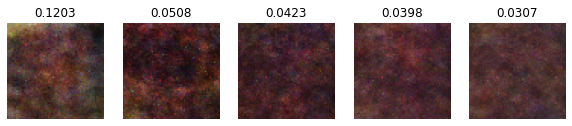

Epoch 67000 	 g_loss: 5.3965, d_loss:0.0656, d_acc: 0.9727


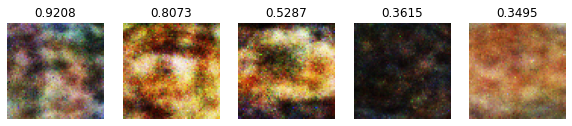

Epoch 68000 	 g_loss: 7.5609, d_loss:0.0536, d_acc: 0.9922


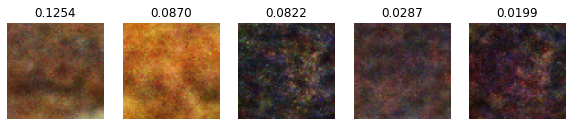

Epoch 69000 	 g_loss: 7.8938, d_loss:0.0194, d_acc: 0.9922


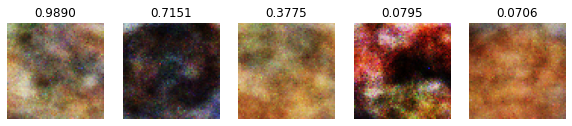

Epoch 70000 	 g_loss: 6.3813, d_loss:0.0510, d_acc: 0.9805


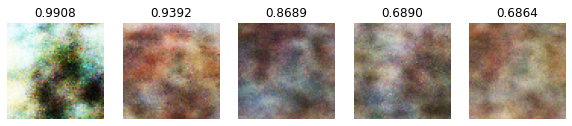

Epoch 71000 	 g_loss: 5.3610, d_loss:0.0814, d_acc: 0.9844


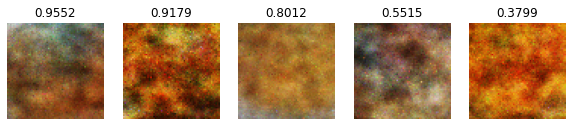

Epoch 72000 	 g_loss: 7.8072, d_loss:0.0026, d_acc: 1.0000


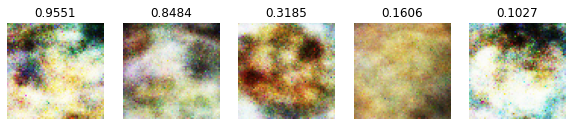

Epoch 73000 	 g_loss: 6.1705, d_loss:0.0529, d_acc: 0.9805


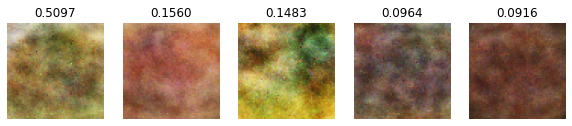

Epoch 74000 	 g_loss: 7.8301, d_loss:0.0453, d_acc: 0.9844


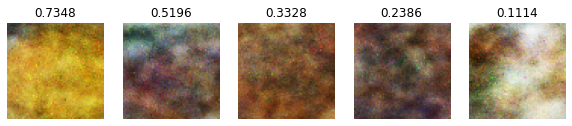

Epoch 75000 	 g_loss: 9.3374, d_loss:0.0295, d_acc: 0.9883


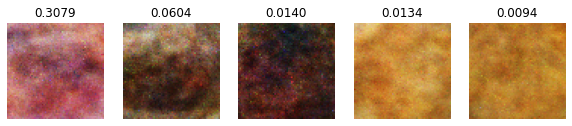

Epoch 76000 	 g_loss: 7.6402, d_loss:0.0470, d_acc: 0.9844


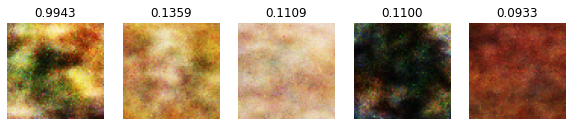

Epoch 77000 	 g_loss: 9.3499, d_loss:0.0088, d_acc: 0.9961


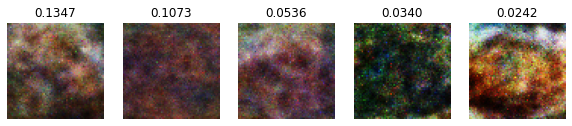

Epoch 78000 	 g_loss: 7.6430, d_loss:0.0183, d_acc: 0.9922


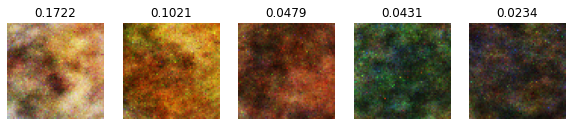

Epoch 79000 	 g_loss: 8.1903, d_loss:0.0184, d_acc: 0.9922


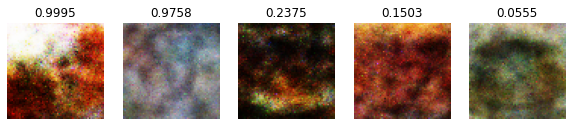

Epoch 80000 	 g_loss: 8.3738, d_loss:0.0016, d_acc: 1.0000


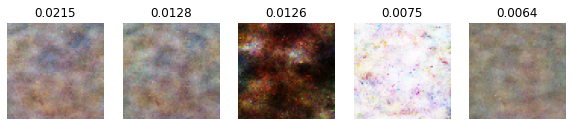

Epoch 81000 	 g_loss: 7.2958, d_loss:0.0135, d_acc: 1.0000


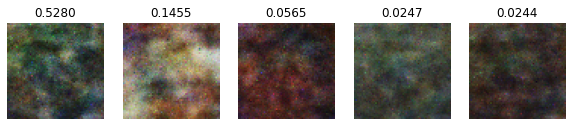

Epoch 82000 	 g_loss: 5.8127, d_loss:0.0916, d_acc: 0.9648


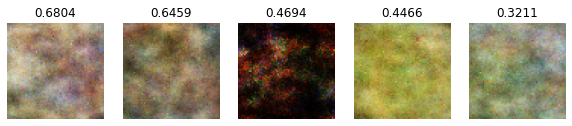

Epoch 83000 	 g_loss: 6.5373, d_loss:0.0197, d_acc: 0.9922


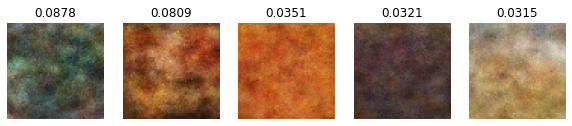

Epoch 84000 	 g_loss: 6.6138, d_loss:0.0457, d_acc: 0.9805


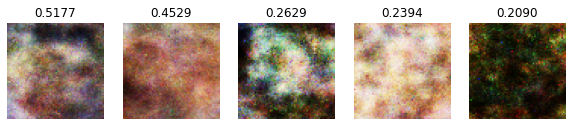

Epoch 85000 	 g_loss: 6.9716, d_loss:0.0430, d_acc: 0.9883


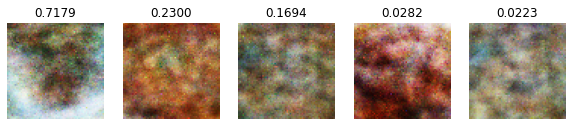

Epoch 86000 	 g_loss: 5.9511, d_loss:0.0458, d_acc: 0.9883


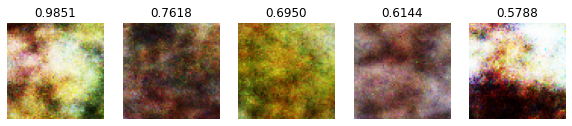

Epoch 87000 	 g_loss: 7.2585, d_loss:0.0102, d_acc: 1.0000


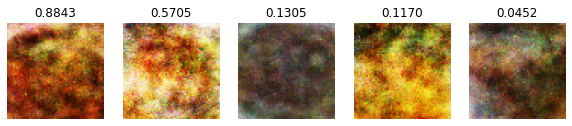

Epoch 88000 	 g_loss: 7.8150, d_loss:0.0020, d_acc: 1.0000


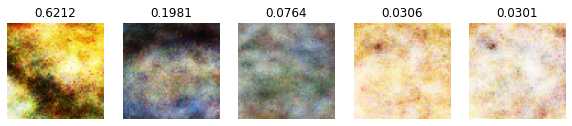

Epoch 89000 	 g_loss: 7.7190, d_loss:0.0039, d_acc: 1.0000


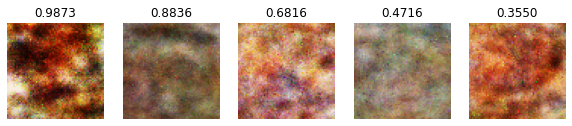

Epoch 90000 	 g_loss: 7.3263, d_loss:0.0028, d_acc: 1.0000


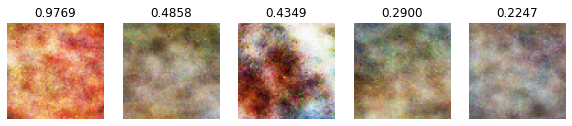

Epoch 91000 	 g_loss: 6.1127, d_loss:0.1091, d_acc: 0.9805


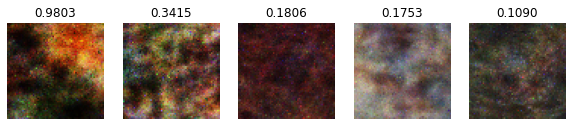

Epoch 92000 	 g_loss: 6.5301, d_loss:0.0686, d_acc: 0.9805


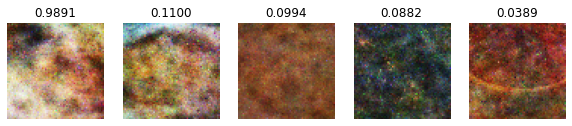

Epoch 93000 	 g_loss: 6.6941, d_loss:0.0381, d_acc: 0.9844


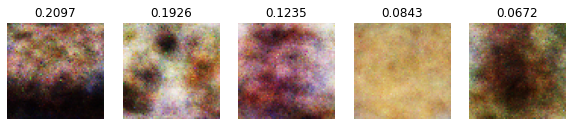

Epoch 94000 	 g_loss: 8.8671, d_loss:0.0110, d_acc: 0.9961


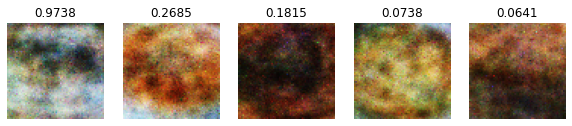

Epoch 95000 	 g_loss: 8.1695, d_loss:0.0069, d_acc: 0.9961


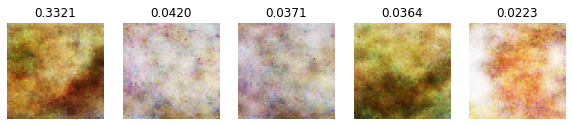

Epoch 96000 	 g_loss: 8.1179, d_loss:0.0679, d_acc: 0.9766


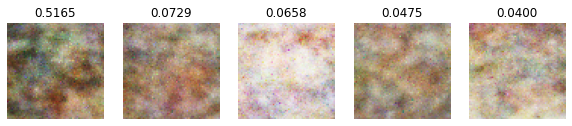

Epoch 97000 	 g_loss: 8.3540, d_loss:0.0321, d_acc: 0.9922


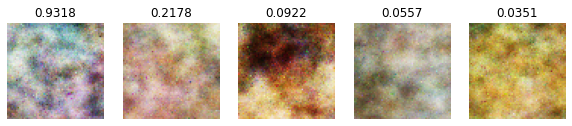

Epoch 98000 	 g_loss: 8.0793, d_loss:0.0109, d_acc: 0.9961


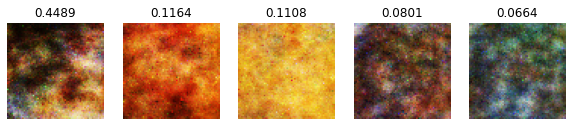

Epoch 99000 	 g_loss: 7.9990, d_loss:0.0461, d_acc: 0.9805


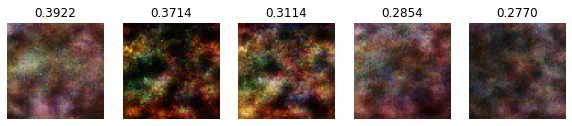

Epoch 100000 	 g_loss: 8.5473, d_loss:0.0238, d_acc: 0.9883


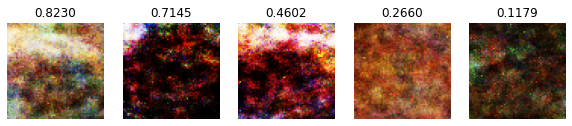

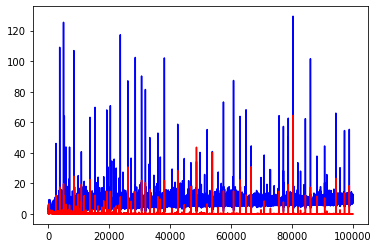

In [8]:
epochs = 100000
batch_size = 128
display_epochs = 1000
cache_epochs = 2000

hidden_dim = 100

# generator params
g_alpha = 0.2
g_momentum = 0.9
g_fc1 = 512
g_fc2 = 1024
g_fc3 = 2048

# discriminator params
d_fc1 = 2048
d_fc2 = 1024
d_fc3 = 512
d_alpha = 0.2
d_dropout_rate = None

## build generator
generator = build_generator(hidden_dim, [g_fc1, g_fc2, g_fc3], g_alpha, g_momentum)
generator.summary()

## build the discriminator
discriminator = build_discriminator([d_fc1, d_fc2, d_fc3], d_alpha, d_dropout_rate)
# compile
discriminator.compile(loss = 'binary_crossentropy',
                      optimizer = Adam(learning_rate = 2e-4, beta_1 = 0.5),
                      metrics = ['accuracy'])
discriminator.summary()

## build combined model
combine_input = Input(shape = (hidden_dim, ), name = 'Com_input')
image = generator(combine_input)
discriminator.trainable = False
fake_image_prediction = discriminator(image)
combined_model = Model(inputs = combine_input, outputs = fake_image_prediction, name = 'combine_model')
combined_model.compile(loss = 'binary_crossentropy',
                       optimizer = Adam(learning_rate = 2e-4, beta_1 = 0.5),
                       metrics = ['accuracy'])
combined_model.summary()


def GAN(epochs, batch_size, display_epochs, cache_epochs):
    
    cache_fake_images = []
    
    d_loss_history = []
    g_loss_history = []
    
    for epoch in range(epochs+1):
   
        # take a batch of real images
        selected_indeces = np.random.randint(0, m, batch_size)
        real_images = data_flatten[selected_indeces]

        # take a fake image
        z = np.random.uniform(low = -1.0, high = 1.0, size = (batch_size, hidden_dim))
        fake_images = generator.predict(z)

        # train discriminator
        d_real_loss, d_real_acc = discriminator.train_on_batch(real_images, np.ones(batch_size))
        d_fake_loss, d_fake_acc = discriminator.train_on_batch(fake_images, np.zeros(batch_size))

        d_loss = 0.5*(d_real_loss + d_fake_loss)
        d_acc = 0.5*(d_real_acc + d_fake_acc)

        # train generator
        z = np.random.uniform(low = -1.0, high = 1.0, size = (batch_size, hidden_dim))
        g_loss, _ = combined_model.train_on_batch(z, np.ones(batch_size))
        
        # log losses
        g_loss_history.append(g_loss)
        d_loss_history.append(d_loss)
        

        if epoch % display_epochs == 0:
            # print info
            print("Epoch {} \t g_loss: {:.4f}, d_loss:{:.4f}, d_acc: {:.4f}".format(
                    epoch, g_loss, d_loss, d_acc))
            
            # find best fakes
            fake_images = generator.predict(z)
            fake_images_scores = np.squeeze(discriminator.predict(fake_images))
            sorted_idx = np.argsort(fake_images_scores.copy(), axis = 0)
            sorted_idx = np.flip(sorted_idx, axis = 0)

            # plot fake image
            plt.figure(figsize = (10,2))
            for i in range(5):
                fake_img = fake_images[sorted_idx[i]].reshape(h, w, 3)
                fake_img = fake_img + 1
                fake_img = fake_img * 127.5
                fake_img = fake_img.astype(int)
                plt.subplot(1,5,i+1)
                plt.axis('off')
                plt.imshow(fake_img)
                plt.title("{:.4f}".format(fake_images_scores[sorted_idx[i]]))
            plt.show()
            

        # save an fake images
        if epoch % cache_epochs == 0:
            cache_fake_images.append(fake_images[sorted_idx[:5]])
            
            
    return (g_loss_history, d_loss_history, cache_fake_images)
            
    
## Train
(g_loss_history, d_loss_history, cache_fake_images) = GAN(epochs, batch_size, display_epochs, cache_epochs)


## Plot loss during training
plt.figure()
plt.plot(g_loss_history, 'b')
plt.plot(d_loss_history, 'r')
plt.show()